<a href="https://colab.research.google.com/github/BearKS/Robotic-weed-control-system/blob/feature%2Fsegmentation/Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install tensorflow==2.9.0
!pip install albumentations>=0.3.0 
!pip install --pre segmentation-models

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [ ]:
!unzip /content/drive/MyDrive/Project/dataset_v2_online.zip

Archive:  /content/drive/MyDrive/Project/dataset_v2_online.zip
replace dataset_v2_online/test/images/image (1).png? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: dataset_v2_online/test/images/image (1).png  
  inflating: dataset_v2_online/test/images/image (12).png  
  inflating: dataset_v2_online/test/images/image (4).png  
  inflating: dataset_v2_online/test/images/T02_Box007_2017-09-06T10-42-48-553_1.png  
  inflating: dataset_v2_online/test/images/T02_Box007_2017-09-11T10-38-11-116_0.png  
  inflating: dataset_v2_online/test/images/T02_Box007_2017-09-11T10-38-11-116_1.png  
  inflating: dataset_v2_online/test/images/T02_Box007_2017-09-11T10-38-11-116_3.png  
  inflating: dataset_v2_online/test/images/T02_Box007_2017-09-12T09-15-11-694_0.png  
  inflating: dataset_v2_online/test/images/T02_Box007_2017-09-21T10-53-55-765_3.png  
  inflating: dataset_v2_online/test/images/T02_Box007_2017-09-24T10-27-28-118_0.png  
  inflating: dataset_v2_online/test/images/T02_Box007_2017-09-25

In [ ]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf 
import keras

In [ ]:
DATA_DIR = 'dataset_v2_online/'
x_train_dir = os.path.join(DATA_DIR, 'train/images')
y_train_dir = os.path.join(DATA_DIR, 'train/masks')

x_valid_dir = os.path.join(DATA_DIR, 'val/images')
y_valid_dir = os.path.join(DATA_DIR, 'val/masks')

x_test_dir = os.path.join(DATA_DIR, 'test/images')
y_test_dir = os.path.join(DATA_DIR, 'test/masks')

In [ ]:
w = 256
h = 256

In [ ]:
# helper function for data visualization
def visualize(**images):
    """PLot images in one row."""
    print('dfsd')
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()
    
# helper function for data visualization    
def denormalize(x):
    """Scale image to range 0..1 for correct plot"""
    x_max = np.percentile(x, 98)
    x_min = np.percentile(x, 2)    
    x = (x - x_min) / (x_max - x_min)
    x = x.clip(0, 1)
    return x
    

# classes for data loading and preprocessing
class Dataset:
    """CamVid Dataset. Read images, apply augmentation and preprocessing transformations.
    
    Args:
        images_dir (str): path to images folder
        masks_dir (str): path to segmentation masks folder
        class_values (list): values of classes to extract from segmentation mask
        augmentation (albumentations.Compose): data transfromation pipeline 
            (e.g. flip, scale, etc.)
        preprocessing (albumentations.Compose): data preprocessing 
            (e.g. noralization, shape manipulation, etc.)
    
    """
    
    CLASSES = ['plant']
    
    def __init__(
            self, 
            images_dir, 
            masks_dir, 
            classes=None, 
            augmentation=None, 
            preprocessing=None,
            upsampling=False,
    ):
       
        self.ids = os.listdir(images_dir)
      

        if(upsampling):
            self.images_fps = [os.path.join(images_dir, image_id) for image_id in self.ids]*2
            self.masks_fps = [os.path.join(masks_dir, image_id) for image_id in self.ids]*2
        else:
            self.images_fps = [os.path.join(images_dir, image_id) for image_id in self.ids]
            self.masks_fps = [os.path.join(masks_dir, image_id) for image_id in self.ids]
      
    
        
        # convert str names to class values on masks
        self.class_values = [self.CLASSES.index(cls.lower()) for cls in classes]
        self.upsampling = upsampling
        self.augmentation = augmentation
        self.preprocessing = preprocessing
    
    def __getitem__(self, i):
        
        
        # read data
        image = cv2.imread(self.images_fps[i])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(self.masks_fps[i], 0)
        
        # mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        
        # extract certain classes from mask (e.g. cars)
        masks = [(mask != v) for v in self.class_values]
        mask = np.stack(masks, axis=-1).astype('float')
        
        
        # add background if mask is not binary
        if mask.shape[-1] != 1:
            background = 1 - mask.sum(axis=-1, keepdims=True)
            mask = np.concatenate((mask, background), axis=-1)
        
        
        # apply augmentations
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
        
        # apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
            
        return image, mask
        
    def __len__(self):
        if(self.upsampling):
            return len(self.ids)*2
        return len(self.ids)
    
    
class Dataloader(keras.utils.Sequence):
    """Load data from dataset and form batches
    
    Args:
        dataset: instance of Dataset class for image loading and preprocessing.
        batch_size: Integet number of images in batch.
        shuffle: Boolean, if `True` shuffle image indexes each epoch.
    """
    
    def __init__(self, dataset, batch_size=1, shuffle=False):
        self.dataset = dataset
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.indexes = np.arange(len(dataset))

        self.on_epoch_end()

    def __getitem__(self, i):
        
        # collect batch data
        start = i * self.batch_size
        stop = (i + 1) * self.batch_size
        data = []
        for j in range(start, stop):
            data.append(self.dataset[j])
        
        # transpose list of lists
        batch = [np.stack(samples, axis=0) for samples in zip(*data)]
        
        return batch
    
    def __len__(self):
        """Denotes the number of batches per epoch"""
        return len(self.indexes) // self.batch_size
    
    def on_epoch_end(self):
        """Callback function to shuffle indexes each epoch"""
        if self.shuffle:
            self.indexes = np.random.permutation(self.indexes)   

dfsd


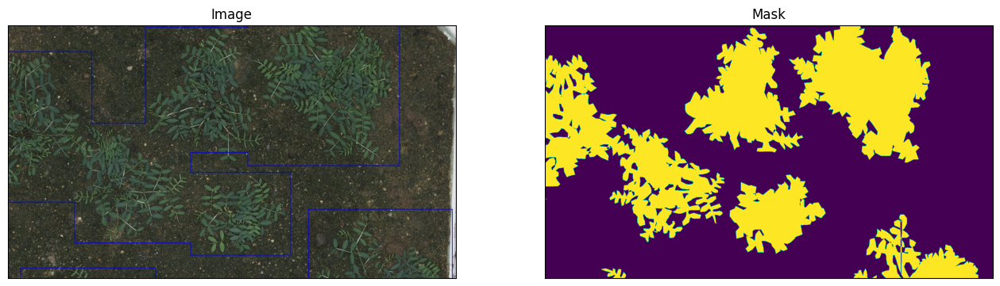

In [ ]:
dataset = Dataset(x_train_dir, y_train_dir, classes=['plant'])

image, mask = dataset[0] # get some sample
# print(image.shape)
# print(mask.shape)
# a = cv2.imread('/content/dataset_v2/test/masks/image (1).png',0)
# print(a.shape)
# cv2.imwrite('ori.png',image)
visualize(
    image=image, 
    mask=mask,
)

In [ ]:
print(len(dataset))

285


##Augmentations

In [ ]:
import albumentations as A

In [ ]:
def round_clip_0_1(x, **kwargs):
    return x.round().clip(0, 1)

# define heavy augmentations
def get_training_augmentation():

    train_transform = [

        
        A.HorizontalFlip(p=0.5),

        A.ShiftScaleRotate(scale_limit=0.5, rotate_limit=0, shift_limit=0.1, p=1, border_mode=0,mask_value=0,value =0),
        A.CropNonEmptyMaskIfExists(height=h, width=w, always_apply=True,p = 1.0,ignore_values=[0]),
        # A.PadIfNeeded(min_height=h, min_width=w, always_apply=True, border_mode=0),
        # # A.RandomCrop(height=h, width=w, always_apply=True),
        # A.CropNonEmptyMaskIfExists(height=h, width=w, always_apply=True,p = 1.0,ignore_values=[0]),

        A.GaussNoise (p=0.2),
        A.Perspective(p=0.5),

        A.OneOf(
            [
                A.CLAHE(p=1),
                A.RandomBrightness(p=1),
                # A.RandomGamma(p=1),
            ],
            p=0.9,
        ),

        A.OneOf(
            [
                A.Sharpen(p=1),
                A.Blur(blur_limit=3, p=1),
                A.MotionBlur(blur_limit=3, p=1),
            ],
            p=0.9,
        ),

        A.OneOf(
            [
                A.RandomBrightnessContrast(p=1),
                A.HueSaturationValue(p=1),
            ],
            p=0.9,
        ),
        # A.Lambda(mask=round_clip_0_1)
    ]
    return A.Compose(train_transform)


def get_validation_augmentation():
    """Add paddings to make image shape divisible by 32"""
    test_transform = [
        A.PadIfNeeded(h, w)
    ]
    return A.Compose(test_transform)

def get_preprocessing(preprocessing_fn):
    """Construct preprocessing transform
    
    Args
        preprocessing_fn (callbale): data normalization function 
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose
    
    """
    
    _transform = [
        A.Lambda(image=preprocessing_fn),
    ]
    return A.Compose(_transform)

/usr/local/lib/python3.10/dist-packages/albumentations/augmentations/transforms.py:1613: FutureWarning: This class has been deprecated. Please use RandomBrightnessContrast
  warnings.warn(


dfsd


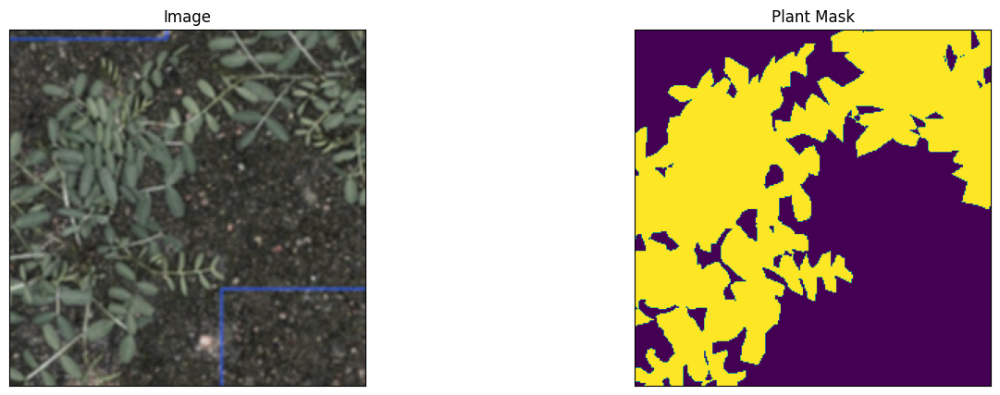

In [ ]:
dataset = Dataset(x_train_dir, y_train_dir, classes=['plant'], augmentation=get_training_augmentation(),upsampling=True)

image, mask = dataset[0] # get some sample

visualize(
    image=image, 
    plant_mask=mask[..., 0].squeeze(),
    # sky_mask=mask[..., 1].squeeze(),
    # background_mask=mask[..., 2].squeeze(),
)

##Segmentation model training

In [ ]:
import segmentation_models as sm
sm.set_framework('tf.keras')
sm.framework()

Segmentation Models: using `keras` framework.


'tf.keras'

In [ ]:
BACKBONE = 'vgg16'
BATCH_SIZE = 8
CLASSES = ['plant']
LR = 0.001
EPOCHS = 80

preprocess_input = sm.get_preprocessing(BACKBONE)

In [ ]:
n_classes = 1 if len(CLASSES) == 1 else (len(CLASSES) + 1)  # case for binary and multiclass segmentation
activation = 'sigmoid' if n_classes == 1 else 'softmax'

#create model
model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)

In [ ]:
# define optomizer
optim = tf.keras.optimizers.Adam(LR)

# Segmentation models losses can be combined together by '+' and scaled by integer or float factor
dice_loss = sm.losses.DiceLoss()
focal_loss = sm.losses.BinaryFocalLoss() if n_classes == 1 else sm.losses.CategoricalFocalLoss()
total_loss = dice_loss + (1 * focal_loss)

metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]

# compile keras model with defined optimozer, loss and metrics
model.compile(optim, total_loss, metrics)

In [ ]:
# Dataset for train images
train_dataset = Dataset(
    x_train_dir, 
    y_train_dir, 
    classes=CLASSES, 
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
    upsampling=True,
   
)

# Dataset for validation images
valid_dataset = Dataset(
    x_valid_dir, 
    y_valid_dir, 
    classes=CLASSES, 
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
    upsampling=True,
)

train_dataloader = Dataloader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader = Dataloader(valid_dataset, batch_size=1, shuffle=False)

# check shapes for errors
assert train_dataloader[0][0].shape == (BATCH_SIZE, h, w, 3)
assert train_dataloader[0][1].shape == (BATCH_SIZE, h, w, n_classes)

# define callbacks for learning rate scheduling and best checkpoints saving
callbacks = [
    # keras.callbacks.ModelCheckpoint('./model_v5_1024.h5', save_weights_only=True, save_best_only=True, mode='min'),
    keras.callbacks.ModelCheckpoint('./model_v16_256_vgg16.h5', save_weights_only=False, save_best_only=True, mode='max',monitor='val_iou_score'),
    # keras.callbacks.ModelCheckpoint('./model_v7_128.h5', save_weights_only=False, save_best_only=True),
    keras.callbacks.ReduceLROnPlateau(),
]

In [ ]:
print(len(train_dataset))

570


143.061 -87.68
dfsd


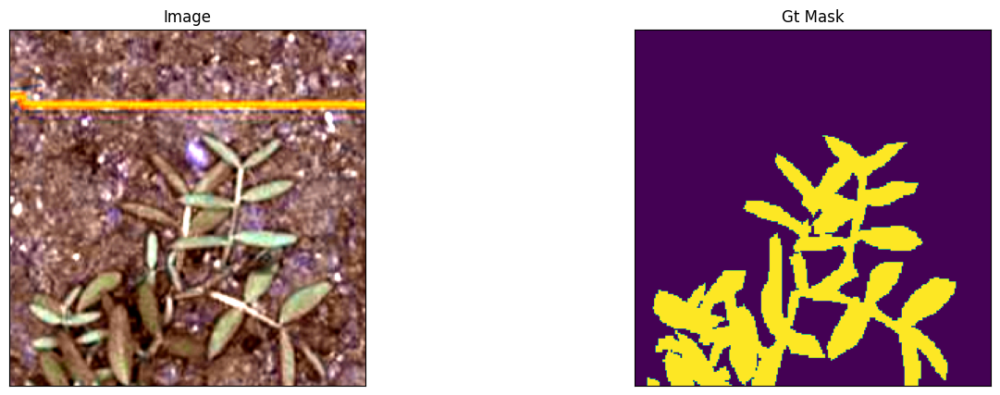

In [ ]:
# for i in range(10):
    
image, gt_mask = train_dataset[2]
# print(denormalize(image)*255)

print(np.max(image),np.min(image))
image = np.expand_dims(image, axis=0)

visualize(
    image=denormalize(image.squeeze()),
    gt_mask=gt_mask[..., 0].squeeze(),
)

In [ ]:
# train model
%%time
history = model.fit(
    train_dataloader, 
    steps_per_epoch=len(train_dataloader), 
    epochs=EPOCHS, 
    callbacks=callbacks, 
    validation_data=valid_dataloader, 
    validation_steps=len(valid_dataloader),
)

Epoch 1/80
71/71 [==============================] - 121s 2s/step - loss: 0.5046 - iou_score: 0.5643 - f1-score: 0.7074 - val_loss: 0.6031 - val_iou_score: 0.6120 - val_f1-score: 0.7508 - lr: 0.0010
Epoch 2/80
71/71 [==============================] - 119s 2s/step - loss: 0.3570 - iou_score: 0.6372 - f1-score: 0.7741 - val_loss: 0.3674 - val_iou_score: 0.6765 - val_f1-score: 0.8039 - lr: 0.0010
Epoch 3/80
71/71 [==============================] - 117s 2s/step - loss: 0.3000 - iou_score: 0.6806 - f1-score: 0.8081 - val_loss: 0.3828 - val_iou_score: 0.6200 - val_f1-score: 0.7565 - lr: 0.0010
Epoch 4/80
71/71 [==============================] - 118s 2s/step - loss: 0.3110 - iou_score: 0.6720 - f1-score: 0.8012 - val_loss: 0.2838 - val_iou_score: 0.6780 - val_f1-score: 0.8043 - lr: 0.0010
Epoch 5/80
71/71 [==============================] - 118s 2s/step - loss: 0.3073 - iou_score: 0.6761 - f1-score: 0.8040 - val_loss: 0.2526 - val_iou_score: 0.7067 - val_f1-score: 0.8257 - lr: 0.0010
Epoch 6/80

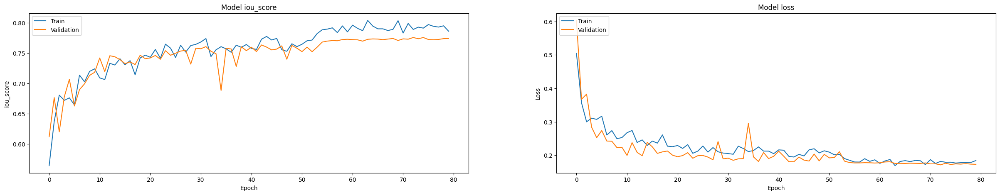

In [ ]:
# Plot training & validation iou_score values
plt.figure(figsize=(30, 5))
plt.subplot(121)
plt.plot(history.history['iou_score'])
plt.plot(history.history['val_iou_score'])
plt.title('Model iou_score')
plt.ylabel('iou_score')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(122)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.savefig("squares2.png")
plt.show()

##Model Evaluation

In [ ]:
test_dataset = Dataset(
    x_test_dir, 
    y_test_dir, 
    classes=CLASSES, 
    augmentation=get_validation_augmentation(),
    preprocessing=get_preprocessing(preprocess_input),
)

test_dataloader = Dataloader(test_dataset, batch_size=1, shuffle=False)

In [ ]:
scores = model.evaluate(test_dataloader)

print("Loss: {:.5}".format(scores[0]))
for metric, value in zip(metrics, scores[1:]):
    print("mean {}: {:.5}".format(metric.__name__, value))

43/43 [==============================] - 13s 296ms/step - loss: 0.1778 - iou_score: 0.7694 - f1-score: 0.8683
Loss: 0.17781
mean iou_score: 0.76942
mean f1-score: 0.86827


In [ ]:
model.save('/content/drive/MyDrive/Project/model_v16_256_vgg16.h5')

##Visualization of results on test dataset

1/1 [==============================] - 0s 312ms/step
(1, 1088, 1920, 1)
dfsd


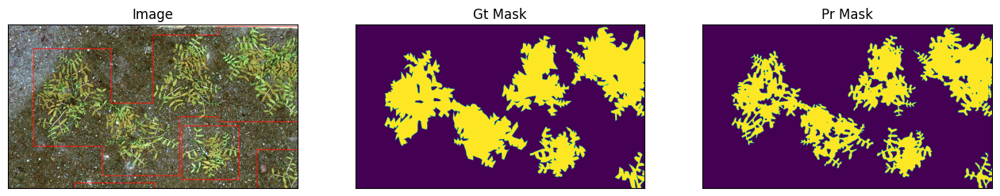

1/1 [==============================] - 0s 35ms/step
(1, 1088, 1920, 1)
dfsd


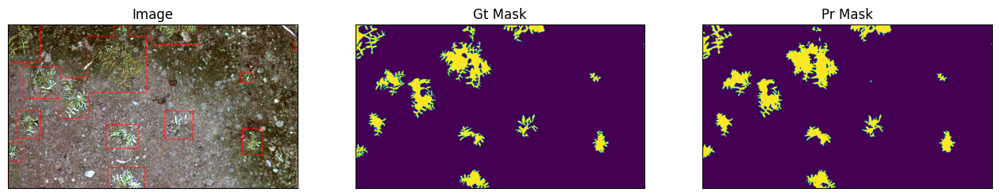

1/1 [==============================] - 0s 34ms/step
(1, 1088, 1920, 1)
dfsd


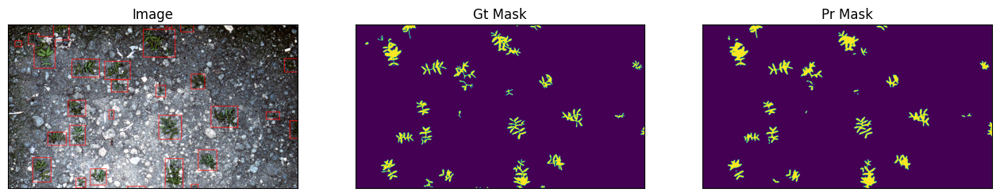

1/1 [==============================] - 0s 34ms/step
(1, 1088, 1920, 1)
dfsd


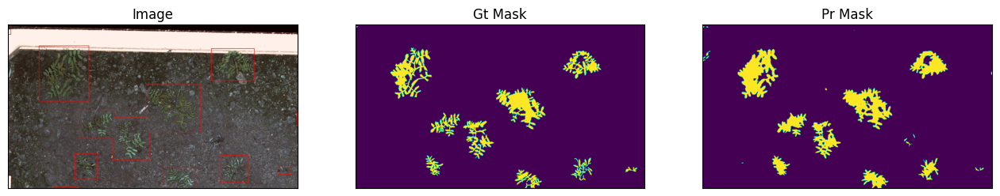

1/1 [==============================] - 0s 322ms/step
(1, 960, 960, 1)
dfsd


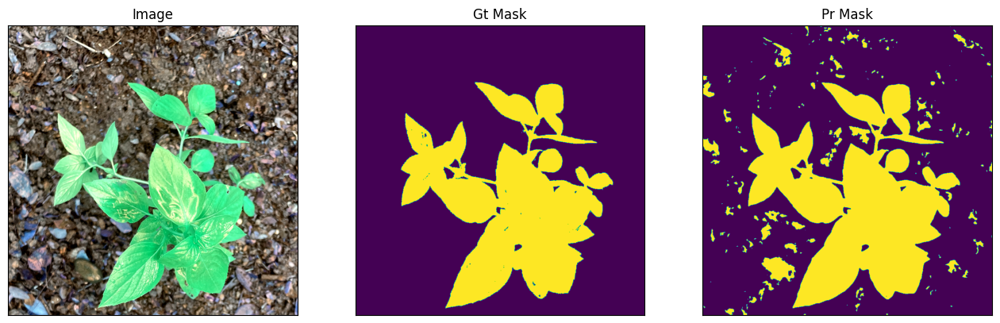

1/1 [==============================] - 0s 33ms/step
(1, 1088, 1920, 1)
dfsd


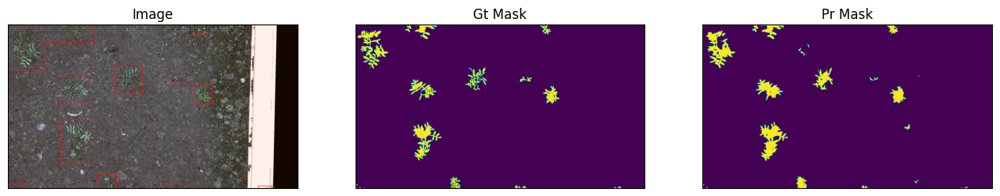

1/1 [==============================] - 0s 35ms/step
(1, 1088, 1920, 1)
dfsd


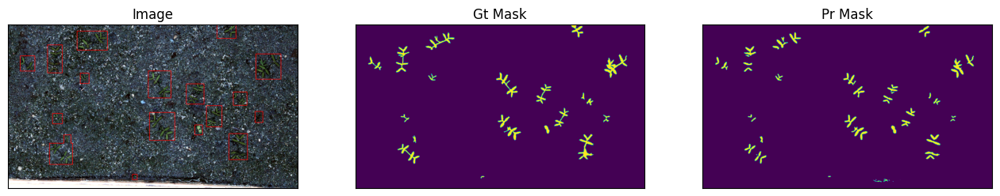

1/1 [==============================] - 0s 38ms/step
(1, 1088, 1920, 1)
dfsd


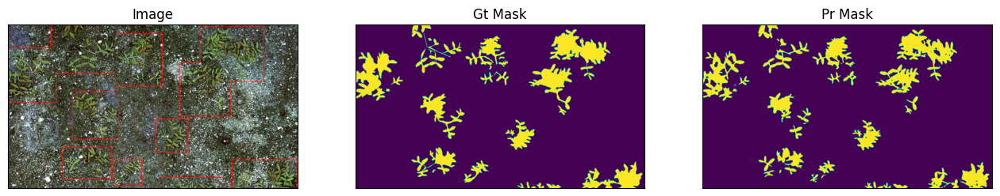

1/1 [==============================] - 0s 48ms/step
(1, 1088, 1920, 1)
dfsd


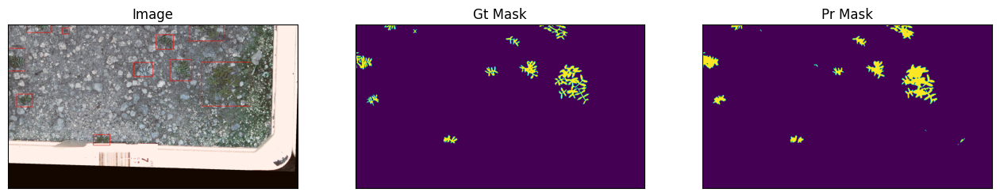

1/1 [==============================] - 0s 39ms/step
(1, 1088, 1920, 1)
dfsd


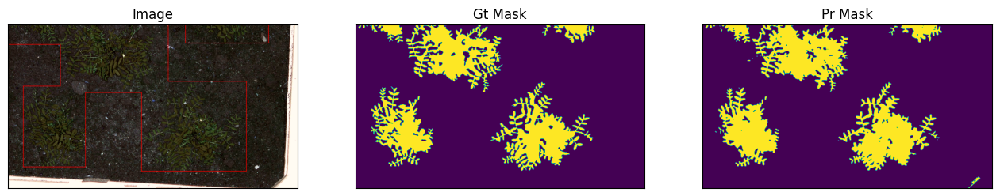

1/1 [==============================] - 0s 45ms/step
(1, 1088, 1920, 1)
dfsd


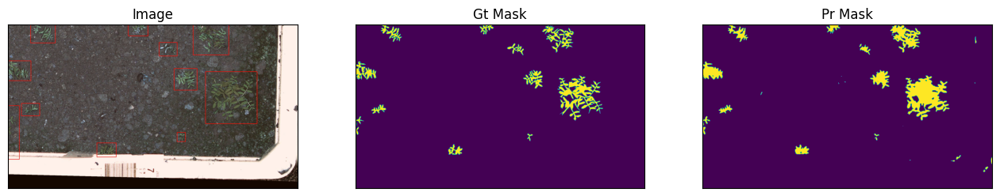

1/1 [==============================] - 0s 36ms/step
(1, 1088, 1920, 1)
dfsd


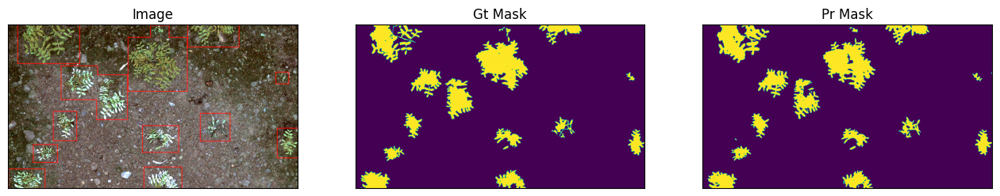

1/1 [==============================] - 0s 35ms/step
(1, 1088, 1920, 1)
dfsd


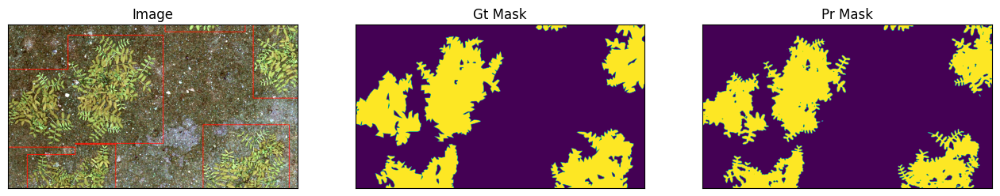

1/1 [==============================] - 0s 35ms/step
(1, 1088, 1920, 1)
dfsd


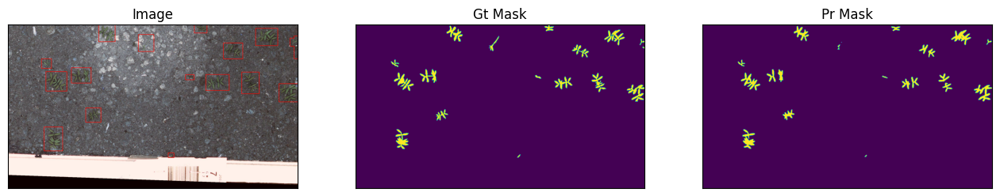

1/1 [==============================] - 0s 35ms/step
(1, 1088, 1920, 1)
dfsd


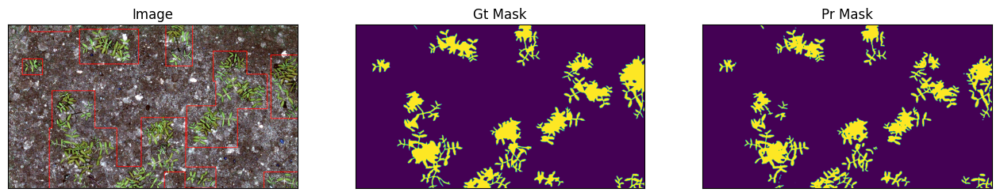

1/1 [==============================] - 0s 34ms/step
(1, 1088, 1920, 1)
dfsd


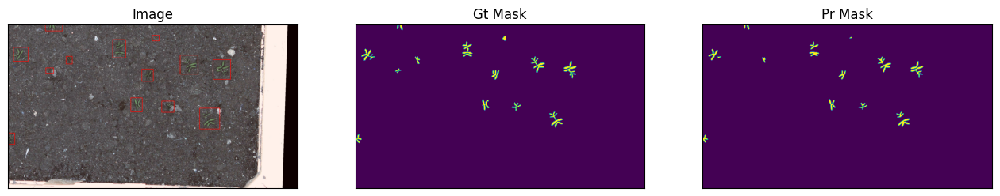

1/1 [==============================] - 0s 35ms/step
(1, 1088, 1920, 1)
dfsd


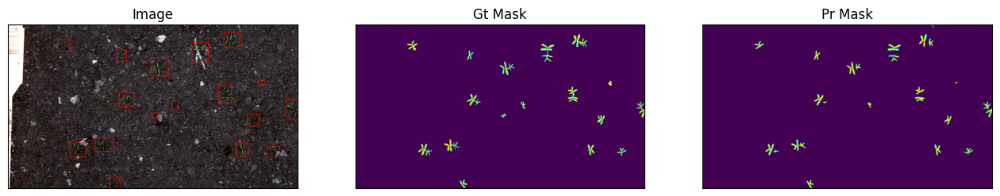

1/1 [==============================] - 0s 35ms/step
(1, 1088, 1920, 1)
dfsd


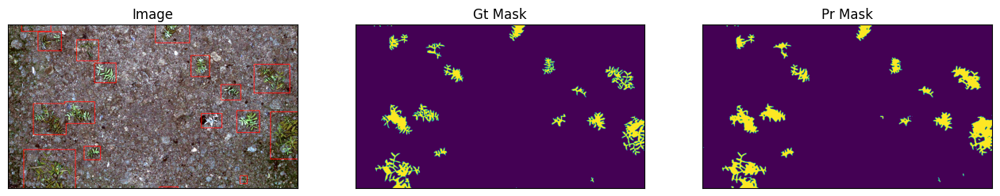

1/1 [==============================] - 0s 35ms/step
(1, 1088, 1920, 1)
dfsd


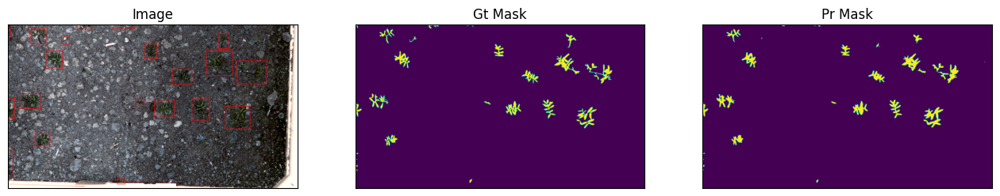

1/1 [==============================] - 0s 36ms/step
(1, 1088, 1920, 1)
dfsd


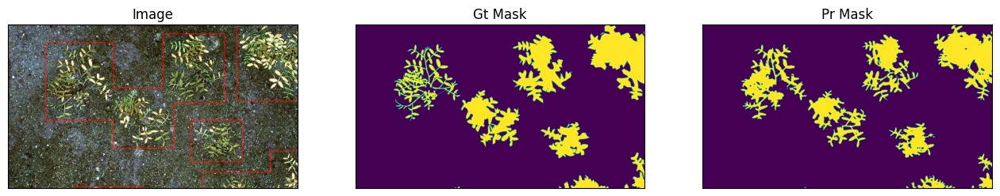

1/1 [==============================] - 0s 36ms/step
(1, 1088, 1920, 1)
dfsd


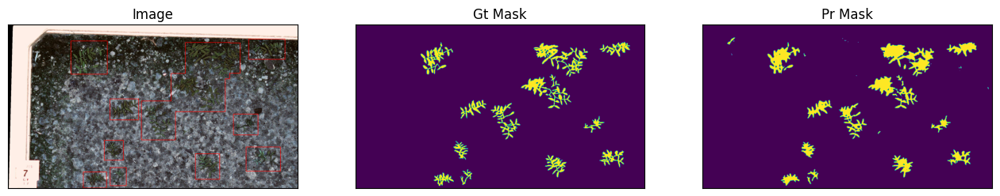

1/1 [==============================] - 0s 39ms/step
(1, 1088, 1920, 1)
dfsd


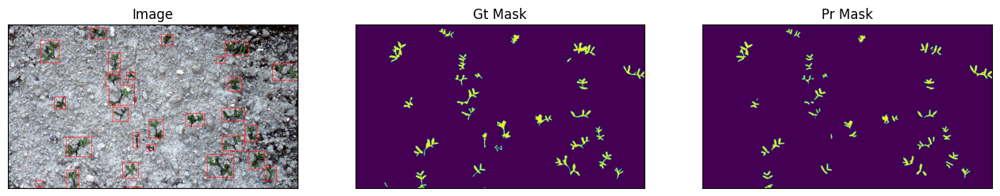

1/1 [==============================] - 0s 34ms/step
(1, 1088, 1920, 1)
dfsd


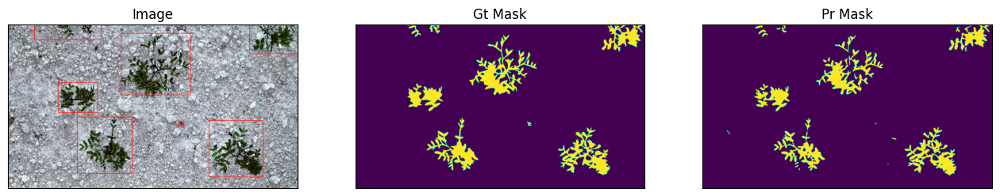

1/1 [==============================] - 0s 40ms/step
(1, 1088, 1920, 1)
dfsd


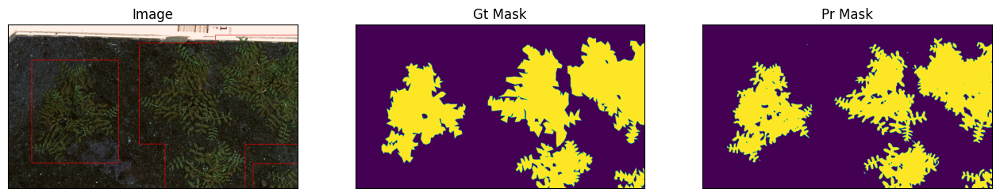

1/1 [==============================] - 0s 34ms/step
(1, 1088, 1920, 1)
dfsd


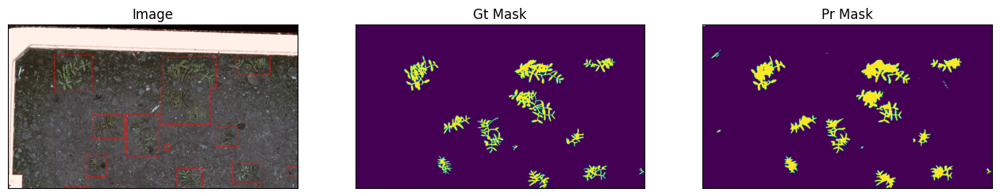

1/1 [==============================] - 0s 27ms/step
(1, 960, 960, 1)
dfsd


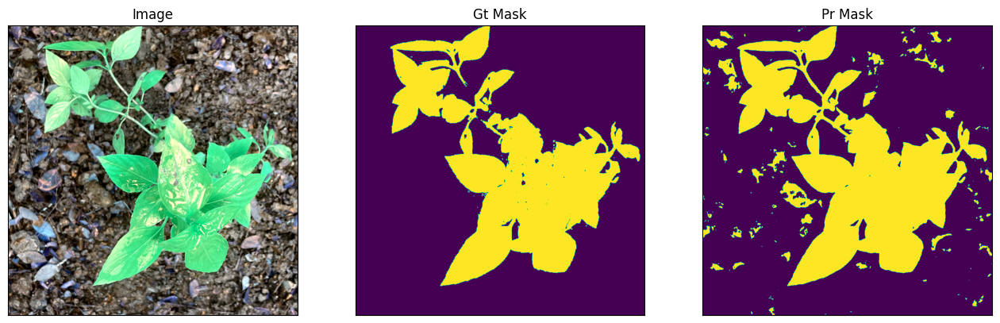

1/1 [==============================] - 0s 34ms/step
(1, 1088, 1920, 1)
dfsd


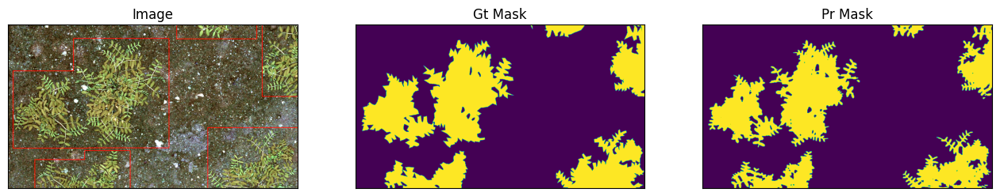

1/1 [==============================] - 0s 35ms/step
(1, 1088, 1920, 1)
dfsd


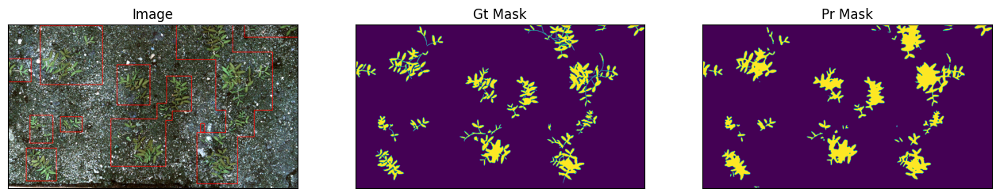

1/1 [==============================] - 0s 33ms/step
(1, 1088, 1920, 1)
dfsd


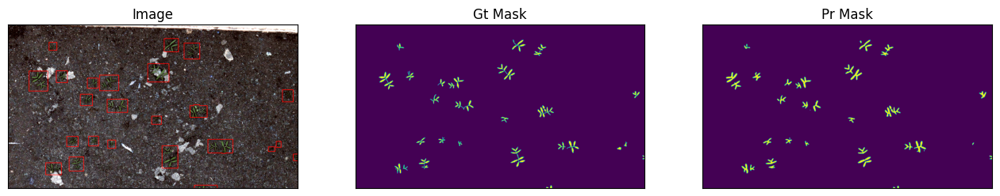

1/1 [==============================] - 0s 33ms/step
(1, 1088, 1920, 1)
dfsd


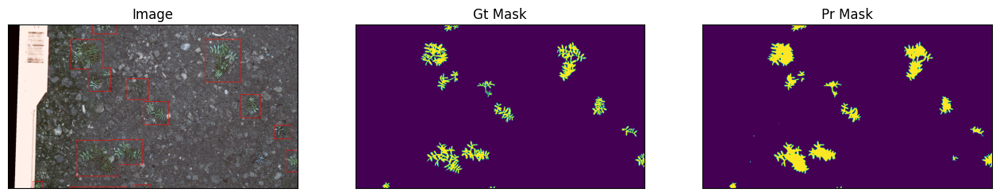

1/1 [==============================] - 0s 41ms/step
(1, 1088, 1920, 1)
dfsd


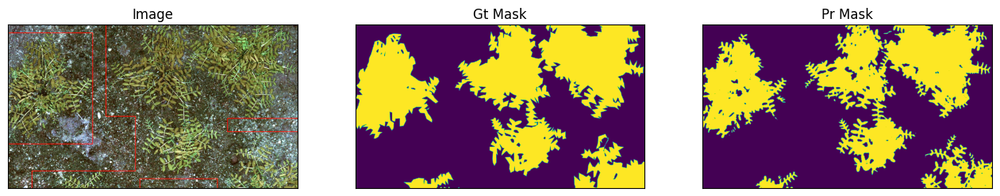

1/1 [==============================] - 0s 37ms/step
(1, 1088, 1920, 1)
dfsd


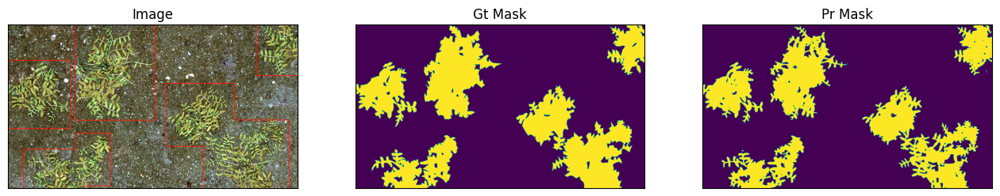

1/1 [==============================] - 0s 39ms/step
(1, 1088, 1920, 1)
dfsd


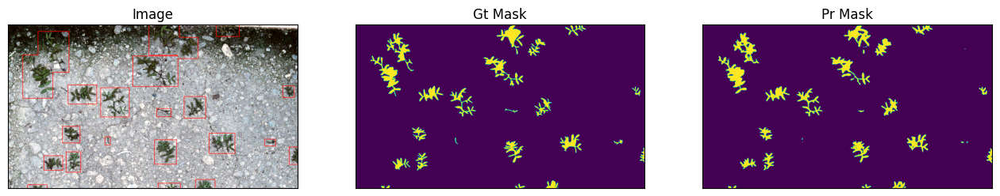

1/1 [==============================] - 0s 30ms/step
(1, 960, 960, 1)
dfsd


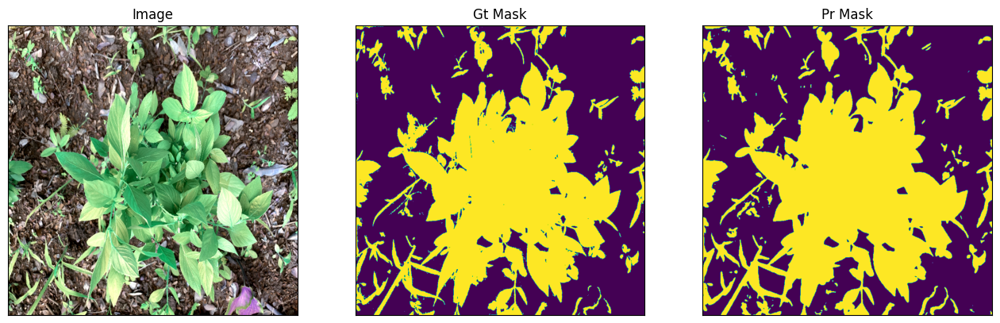

1/1 [==============================] - 0s 38ms/step
(1, 1088, 1920, 1)
dfsd


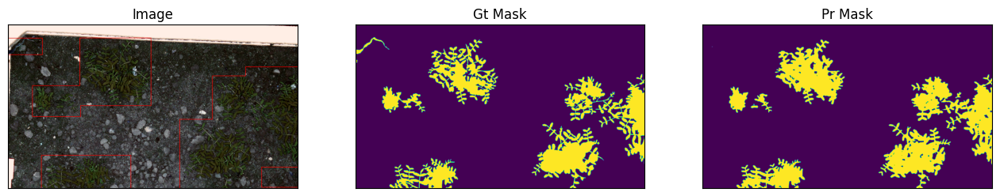

1/1 [==============================] - 0s 36ms/step
(1, 1088, 1920, 1)
dfsd


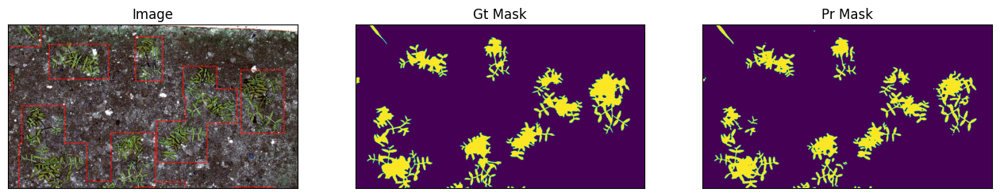

1/1 [==============================] - 0s 34ms/step
(1, 1088, 1920, 1)
dfsd


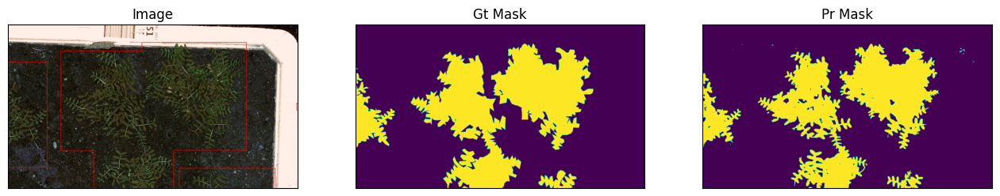

1/1 [==============================] - 0s 34ms/step
(1, 1088, 1920, 1)
dfsd


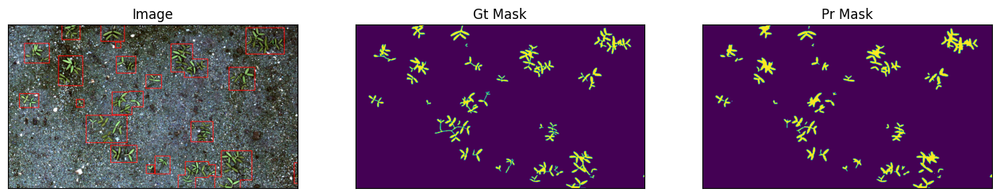

1/1 [==============================] - 0s 36ms/step
(1, 1088, 1920, 1)
dfsd


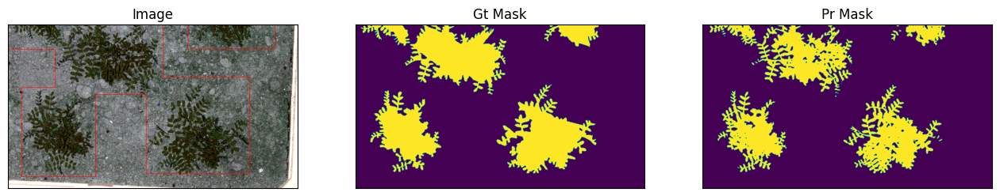

1/1 [==============================] - 0s 36ms/step
(1, 1088, 1920, 1)
dfsd


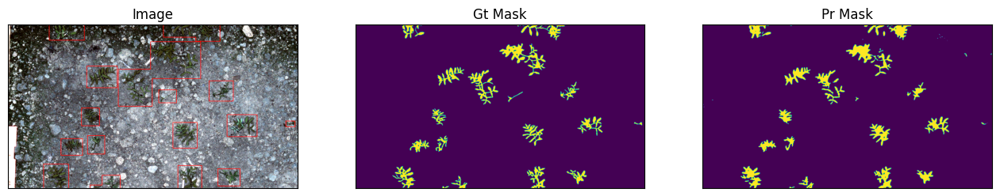

1/1 [==============================] - 0s 34ms/step
(1, 1088, 1920, 1)
dfsd


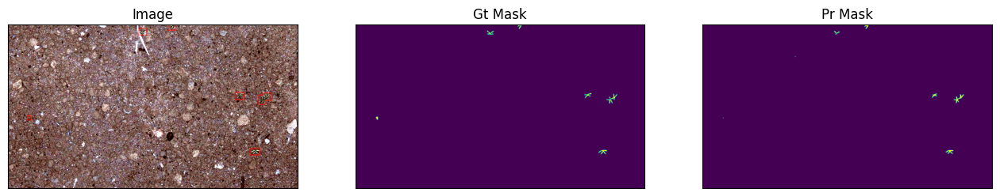

1/1 [==============================] - 0s 35ms/step
(1, 1088, 1920, 1)
dfsd


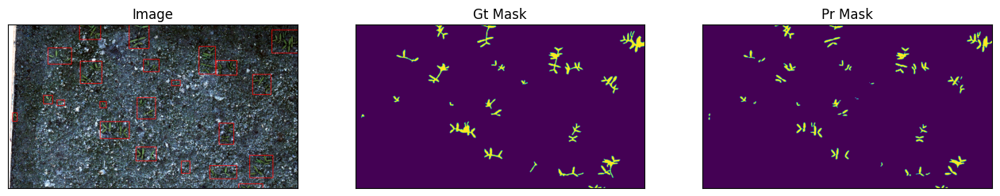

In [ ]:
from PIL import Image

n = 5
ids = np.random.choice(np.arange(len(test_dataset)), size=n)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(5,5))
for i in range(len(test_dataset)-1):
    
    image, gt_mask = test_dataset[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = model.predict(image).round()
    # print(pr_mask.shape)
    # pr_mask = cv2.morphologyEx(pr_mask[..., 0].squeeze(), cv2.MORPH_OPEN, kernel)
    print(pr_mask.shape)
    # im = Image.fromarray(pr_mask)
    # im.save(f'{i}.png')
 
    visualize(
        image=denormalize(image.squeeze()),
        gt_mask=gt_mask[..., 0].squeeze(),
        pr_mask=pr_mask[..., 0].squeeze(),
    )